In [ ]:
import imageio
import matplotlib.pyplot as plt

In [ ]:
img = imageio.imread(r"D:\SML Project\mscoco\train\train2014\train2014\COCO_train2014_000000000030.jpg")

C:\Users\vigne\AppData\Local\Temp\ipykernel_24416\3911274796.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(r"D:\SML Project\mscoco\train\train2014\train2014\COCO_train2014_000000000030.jpg")


In [ ]:
img

array([[[ 27,  32,  28],
        [ 28,  34,  30],
        [ 27,  36,  31],
        ...,
        [ 66,  93,  52],
        [ 66,  95,  51],
        [ 67,  96,  50]],

       [[ 28,  33,  29],
        [ 27,  33,  29],
        [ 26,  35,  30],
        ...,
        [ 66,  93,  52],
        [ 66,  95,  51],
        [ 67,  96,  50]],

       [[ 28,  33,  29],
        [ 27,  33,  29],
        [ 27,  33,  29],
        ...,
        [ 66,  93,  50],
        [ 65,  94,  50],
        [ 66,  95,  49]],

       ...,

       [[177, 179, 178],
        [176, 178, 177],
        [176, 178, 177],
        ...,
        [182, 187, 190],
        [182, 187, 190],
        [181, 186, 189]],

       [[177, 179, 178],
        [177, 179, 178],
        [177, 179, 178],
        ...,
        [182, 187, 190],
        [181, 186, 189],
        [181, 186, 189]],

       [[176, 178, 177],
        [177, 179, 178],
        [177, 179, 178],
        ...,
        [182, 187, 190],
        [181, 186, 189],
        [181, 186, 189]]

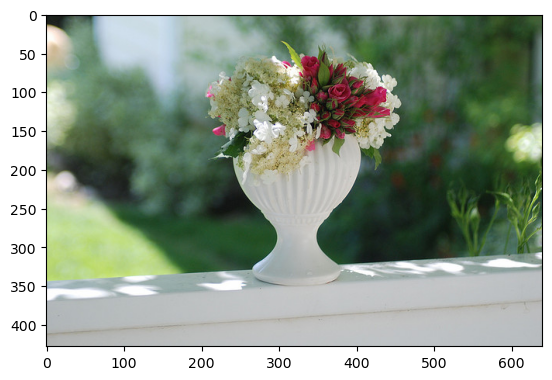

In [ ]:
plt.imshow(img)
plt.show()

In [ ]:
import json

# Open the JSON file
with open(r"C:\Users\vigne\Desktop\Higher studies\Northeastern University Boston\Courses\Semester 1\SML\Project\top1000_answer_vocab.json", 'r') as file:
    # Load the JSON data
    top1000_answer_vocab = json.load(file)

with open(r"C:\Users\vigne\Desktop\Higher studies\Northeastern University Boston\Courses\Semester 1\SML\Project\top1000_answer_vocab_dict.json", 'r') as file:
    # Load the JSON data
    top1000_answer_vocab_dict = json.load(file)

with open(r"C:\Users\vigne\Desktop\Higher studies\Northeastern University Boston\Courses\Semester 1\SML\Project\all_answers_dict.json", 'r') as file:
    # Load the JSON data
    answers = json.load(file)

print(len(top1000_answer_vocab))
print(len(top1000_answer_vocab_dict))
print(len(answers))

1000
1000
82783


In [ ]:
# Generate image ID list and answers dictionary for those images included in top 1000 classes
from collections import Counter
top1000_answers_dict = {}
top1000_image_id_list = []
target_list = top1000_answer_vocab
test_list = ['warm', 'yes', 'yes']
for key in answers:
    test_list = answers[key]
    target_counts = Counter(target_list)
    res = all(target_counts[elem] >= 1 for elem in test_list)
    if res:
        top1000_answers_dict[key] = answers[key]
        s = 'COCO_train2014_'
        top1000_image_id_list.append(s + '0'*(12-len(key)) + key + '.jpg')

In [ ]:
from sklearn.model_selection import train_test_split
train_top1000_image_id_list, test_top1000_image_id_list = train_test_split(top1000_image_id_list, test_size=0.1, random_state=42)
print(len(train_top1000_image_id_list))
print(len(test_top1000_image_id_list))

48653
5406


In [ ]:
def get_questions(questions_path):
    with open(questions_path,'r') as f:
        questions_json = json.load(f)
    questions = questions_json['questions']
    questions_keys = dict()
    for qns in questions:
        key = str(qns['image_id'])
        if key in questions_keys:
            questions_keys[key].append(qns)
        else:
            questions_keys[key] = []
            questions_keys[key].append(qns)
    return questions_keys
questions_dict = get_questions(r"D:\SML Project\mscoco\train\Questions_Train_mscoco\OpenEnded_mscoco_train2014_questions.json")
questions_dict['270070']

[{'question': 'Is this location in a cold climate or a warm climate?',
  'image_id': 270070,
  'question_id': 2700700},
 {'question': 'Can you walk through this?',
  'image_id': 270070,
  'question_id': 2700701},
 {'question': 'Is there anywhere to sit down?',
  'image_id': 270070,
  'question_id': 2700702}]

In [ ]:
#Custom data loader for top1000 answers
import torch
from torch.utils.data import Dataset
import os
from PIL import Image
import json

class CustomDataset(Dataset):
    def __init__(self, root_dir,data_list, top1000_answers_dict, questions,top1000_answer_vocab_dict, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, img) for img in data_list]
        self.top1000_answers_dict = top1000_answers_dict
        self.questions = questions
        self.top1000_answer_vocab_dict = top1000_answer_vocab_dict
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        image_name =os.path.basename(img_path).split('/')[-1]
        image_name = image_name.split('.')[0]
        image_id = image_name.split('_')[-1].lstrip('0')
        if self.transform:
            image = self.transform(image)
        answers = self.top1000_answers_dict[image_id]
        answers_label = [self.top1000_answer_vocab_dict[key] for key in answers]
        return image, answers_label, self.questions[image_id]

In [ ]:
#creating a dataloader
from torch.utils.data import DataLoader
from torchvision import transforms

transform = transforms.Compose([
    # you can add other transformations in this list
    transforms.ToTensor(),
     transforms.Resize((224, 224)),

])

In [ ]:
len(train_top1000_image_id_list)

48653

In [ ]:
#Dataloader for top1000 answers
traindataset = CustomDataset(root_dir=r"D:\SML Project\mscoco\train\train2014\train2014", data_list=train_top1000_image_id_list, top1000_answers_dict=top1000_answers_dict,questions=questions_dict, top1000_answer_vocab_dict=top1000_answer_vocab_dict, transform=transform)
testdataset = CustomDataset(root_dir=r"D:\SML Project\mscoco\train\train2014\train2014", data_list=test_top1000_image_id_list, top1000_answers_dict=top1000_answers_dict,questions=questions_dict, top1000_answer_vocab_dict=top1000_answer_vocab_dict, transform=transform)
traindataloader = DataLoader(traindataset, batch_size=128, shuffle=True)
testdataloader = DataLoader(testdataset, batch_size=128, shuffle=True)

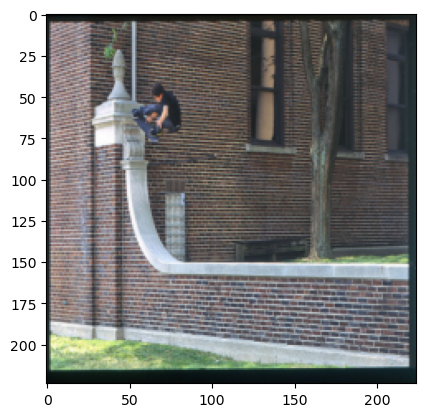

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


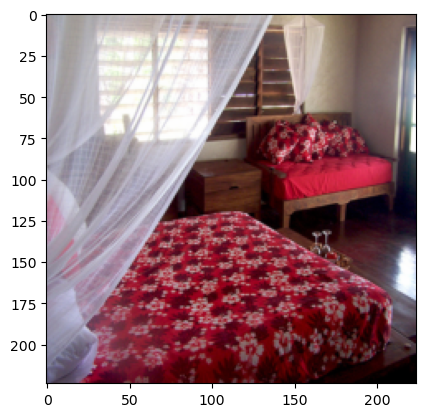

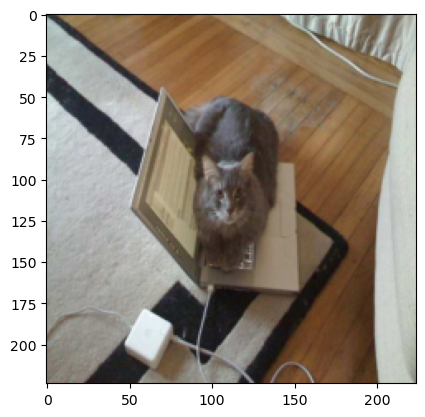

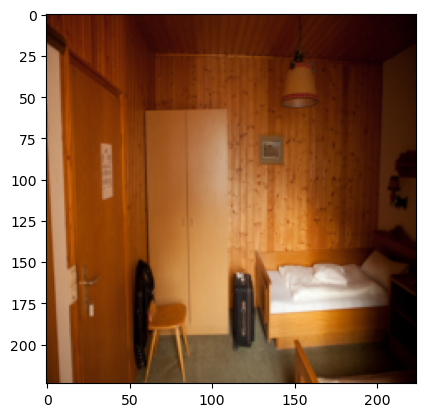

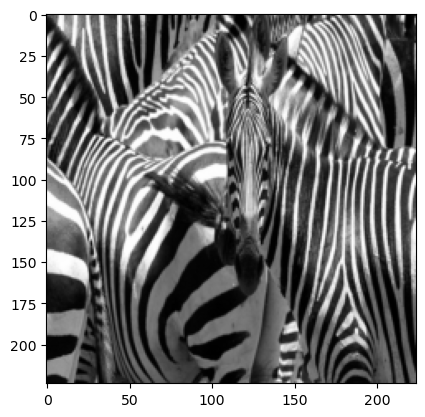

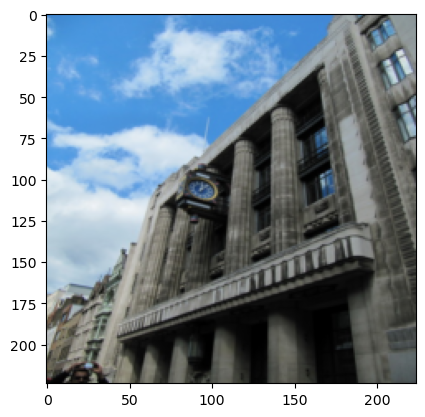

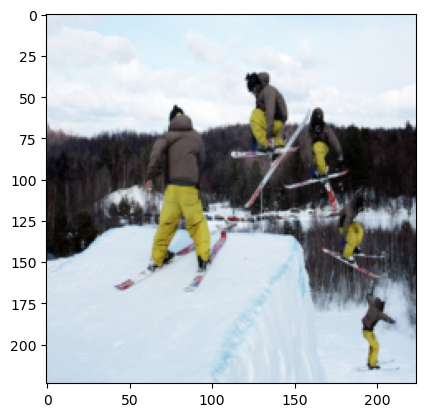

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


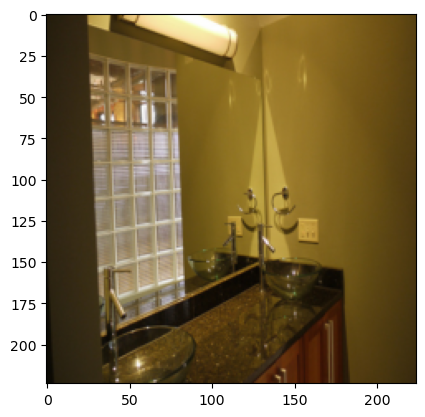

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


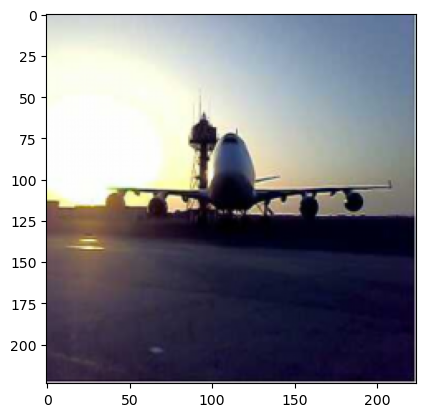

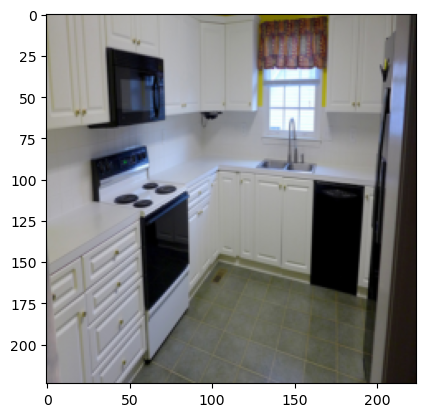

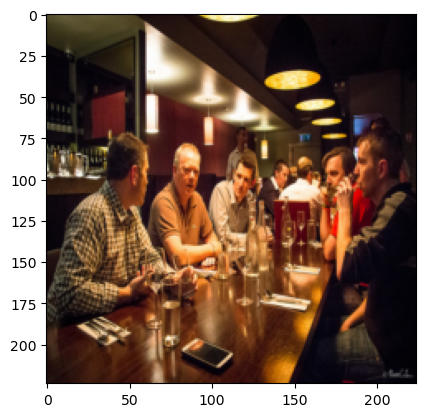

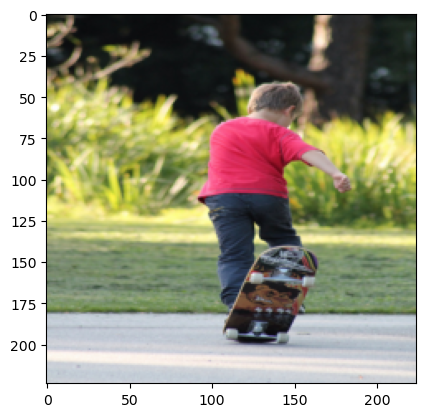

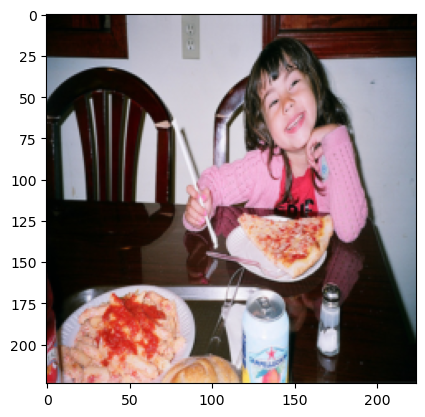

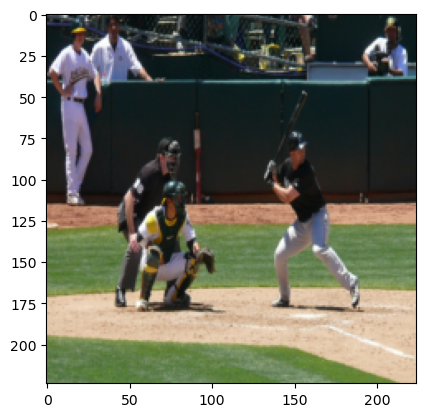

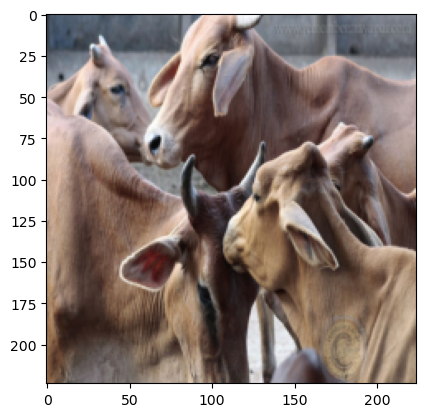

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


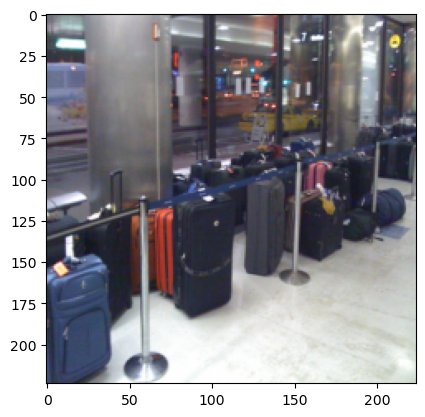

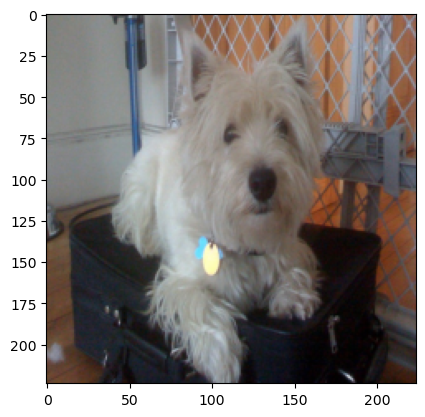

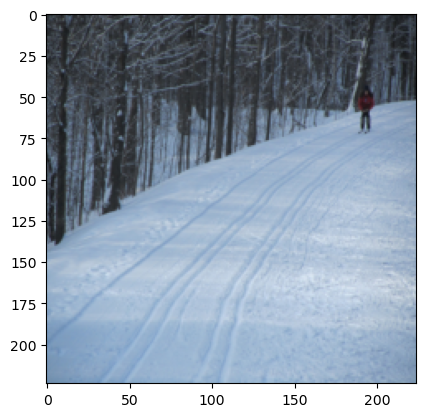

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


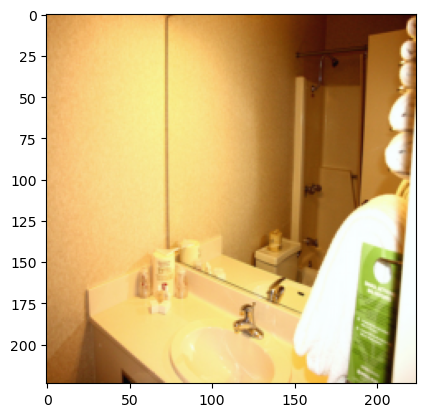

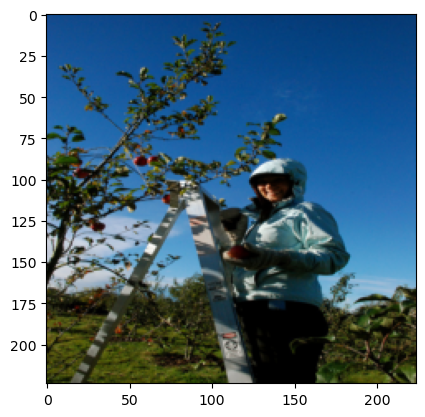

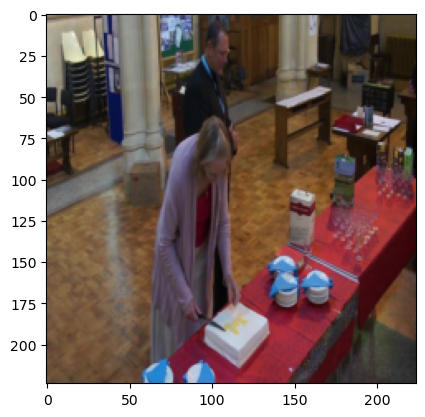

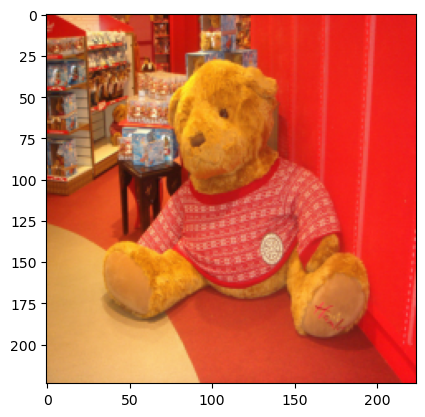

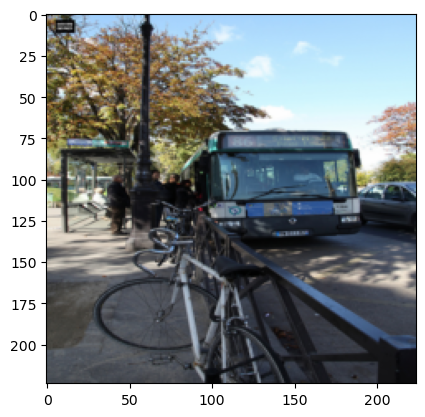

...

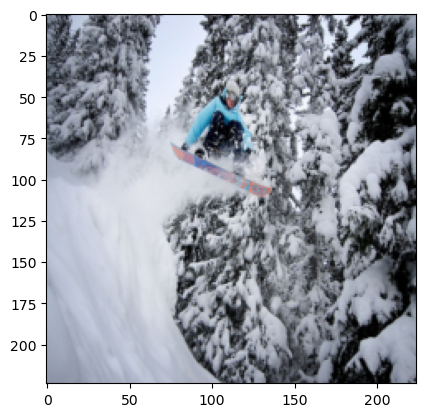

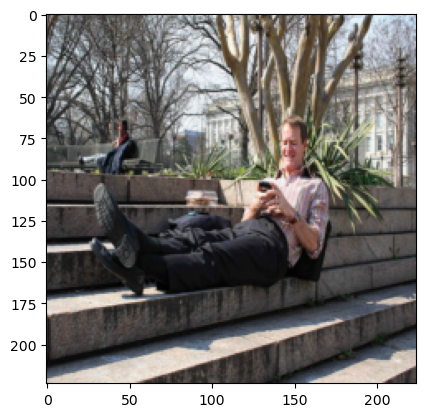

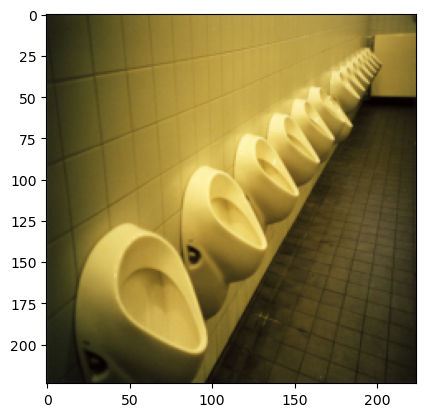

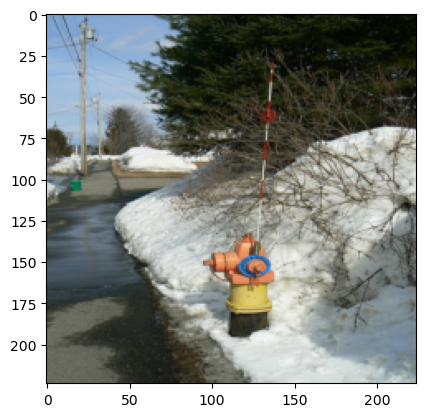

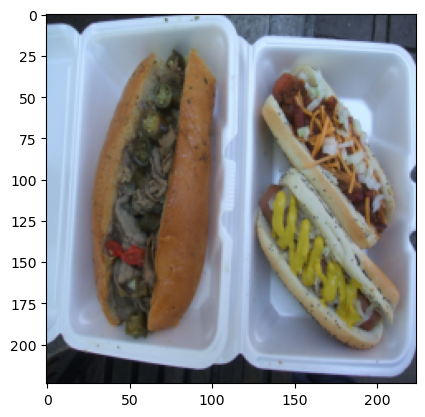

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


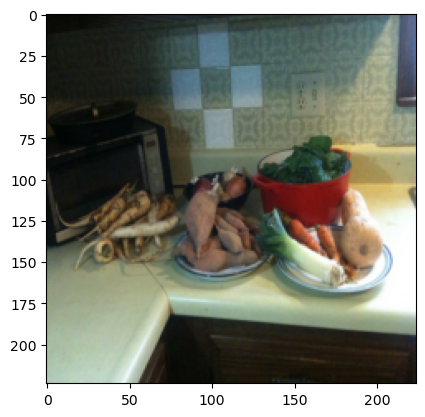





torch.Size([128, 3, 224, 224])
tensor([ 71,   0,  98,   1,  35, 207,  11,   2, 263,  28,   1,   1, 218,   0,
          1,   1,   1,   3,   1,   1,  64, 430,   0,   8,   2,   0,  85, 780,
          1,  11,   2,   1,   3,  72,   1,   0,   0, 319,  27,  42, 192, 240,
          2, 355,   1, 171,  36,   0,  33, 188, 466,  19, 334, 764,   1,   2,
        811, 328, 157,   0,   0,   0,   0,   4,  42,  10,   0,   0,   4,   0,
          0,   0,   2,  23,  14,   0, 526,   1,   0,   0,   0,   0,   9,   0,
          0,   1,   4,   1, 600,   1,   4,   2, 162, 892,   0,   9, 243,   6,
        110,  24,   7, 233,   2, 311,  13,   0, 247,   0,  36,  94,   0,   0,
        342,   1,   1,  50,  54,   0,   3,  15,  16,  11,   3,   1,  31, 174,
        719,  92])




['What is the building made of?', 'Is this a relaxing environment?', 'Where is the cat staring at?', 'Is this in the basement?', 'What color are the zebras?', 'What is the building made of?', 'What color pants is this person wearing?', 'How

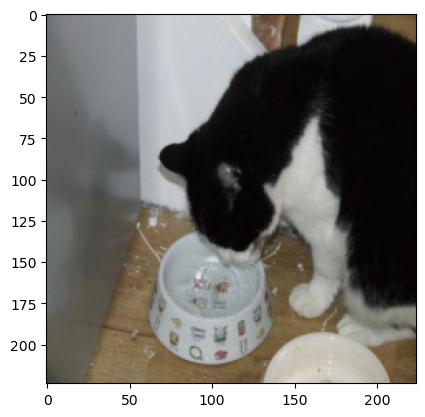

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


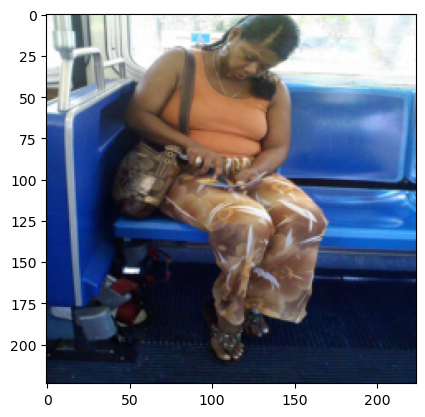

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


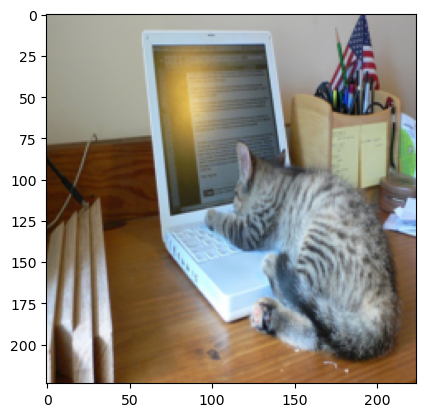

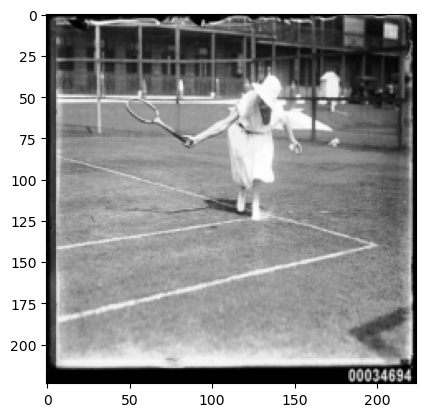

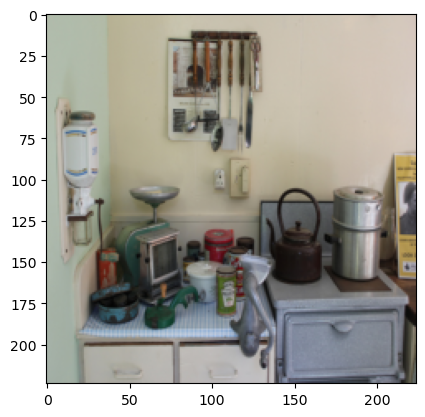

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


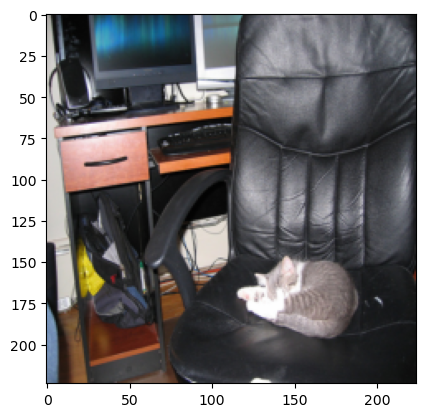

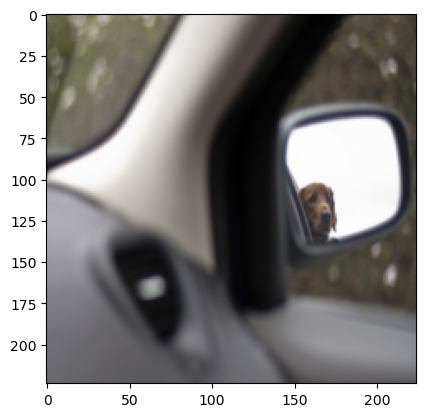

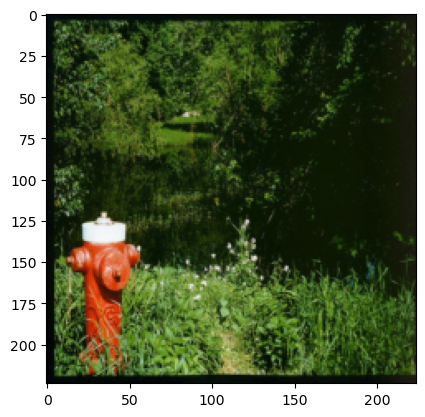

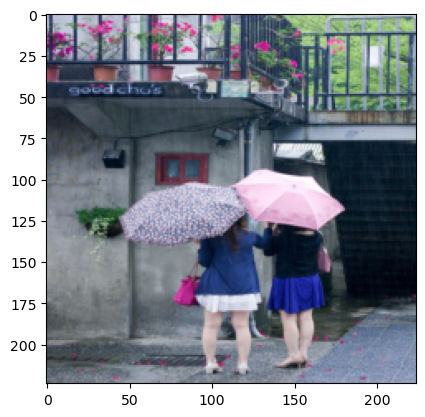

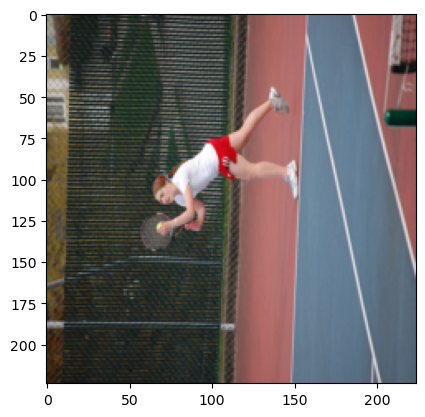

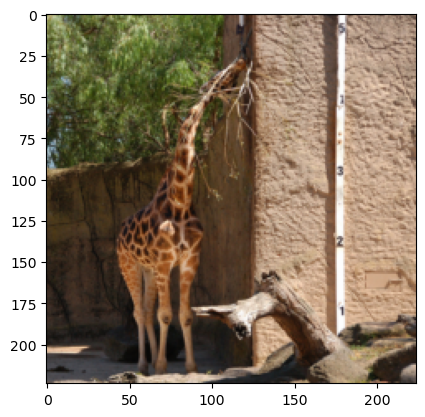

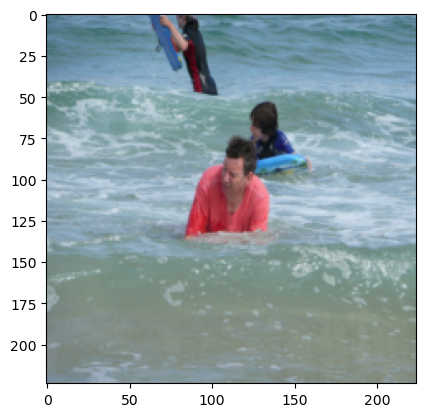

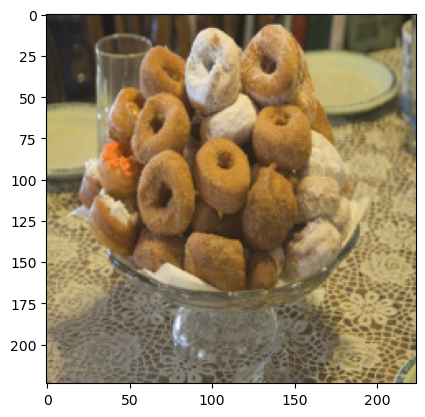

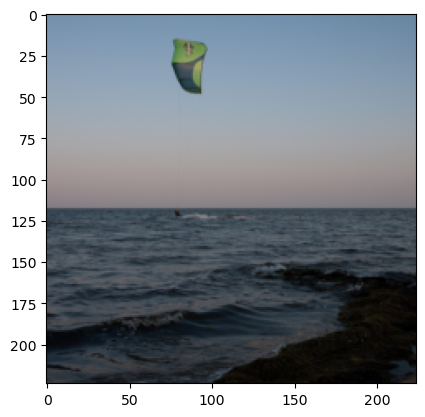

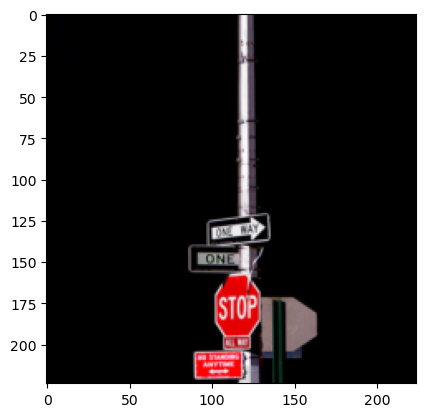

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


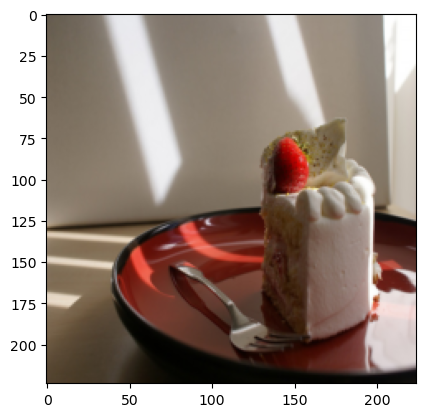

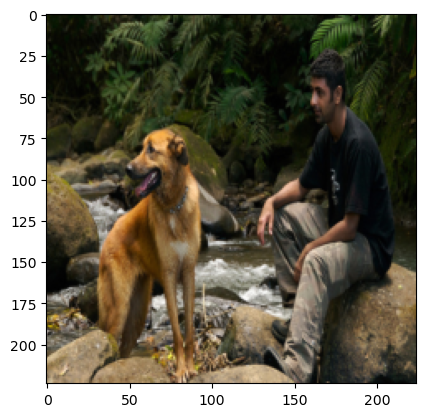

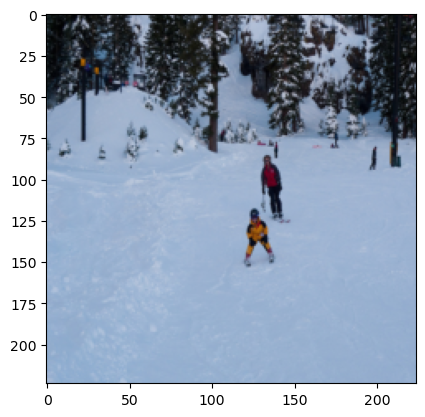

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


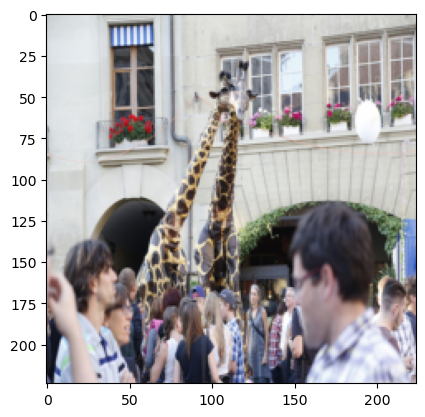

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


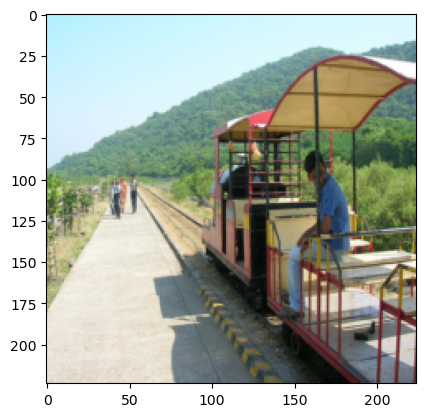

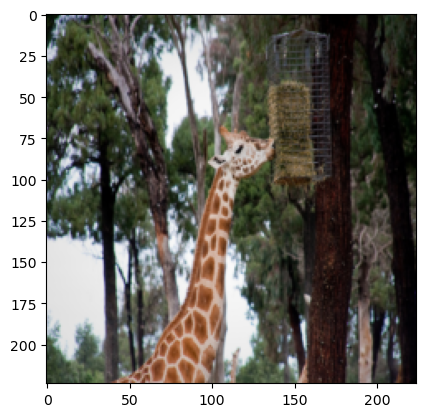

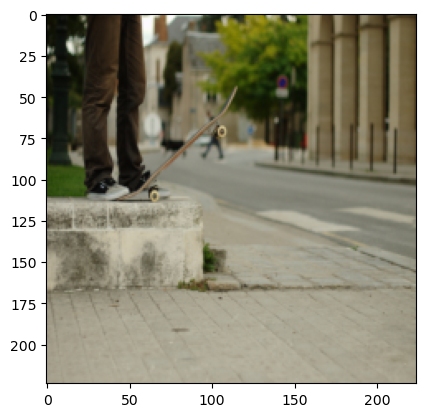

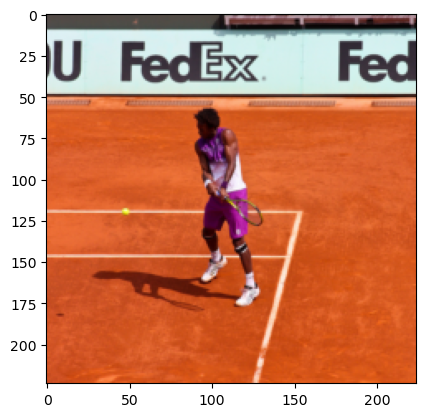

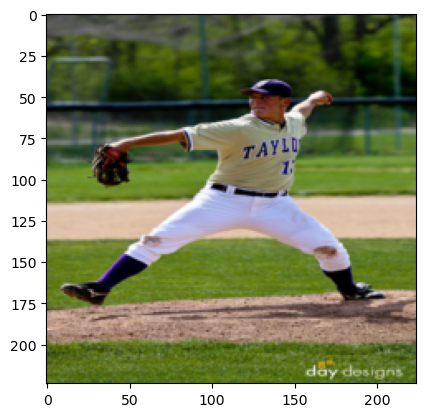

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


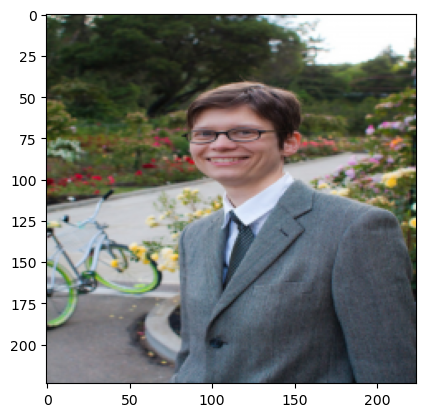

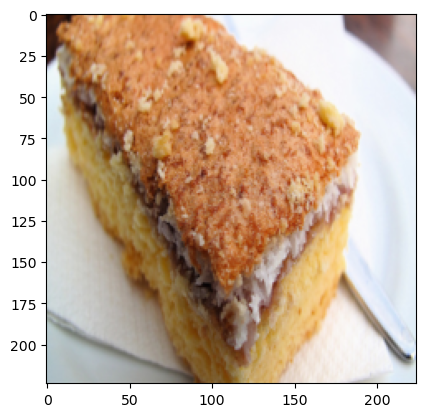

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


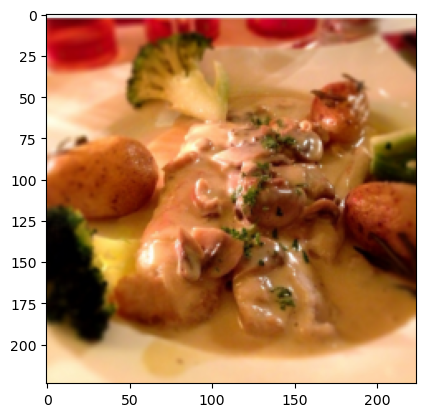

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


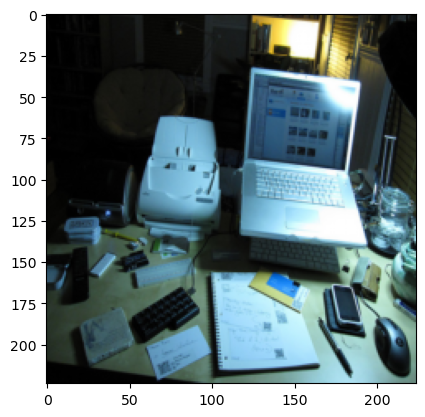

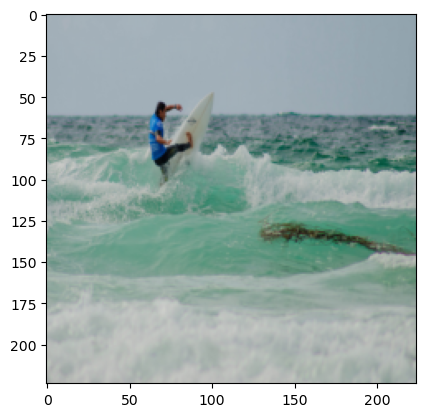

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


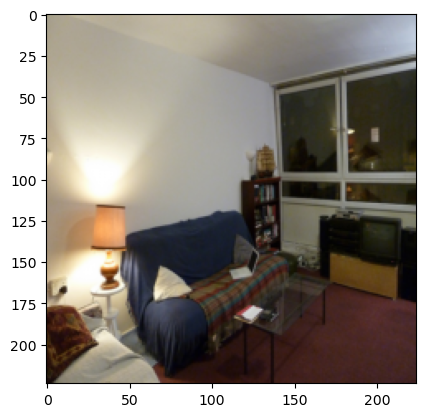

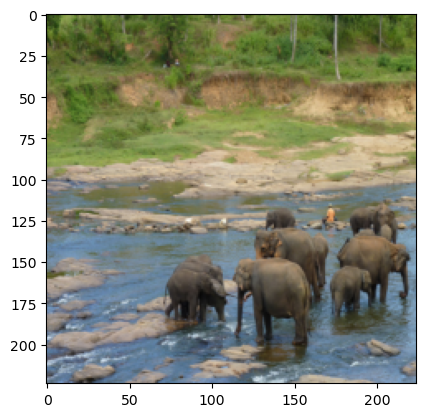

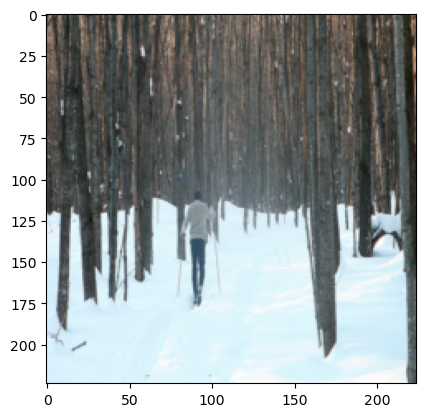





torch.Size([128, 3, 224, 224])
tensor([  1,   7,   0, 145,   0,   1,  33,   6,  90,   7,  58,   1,   8, 372,
          0, 873,  22,   1,   1,   0,   0,   1, 495,  22, 222,   1,  47,   1,
         41,   1, 176,  49,   1,   1,   0,   0,   1,   0,   0, 152,   1,   0,
          1, 324,   1,   0,   6,  36,   0,   0,  35,   1, 173,   2,   6, 514,
          0, 299, 439,   5,   8,  22,   0,  24,   7,   0,   1,  15,  68,   0,
          6,   0,  17,   0,  96,   0,  29,   0,  34,  21,  27,  66,   0,   8,
          1,   0, 124,   0, 522,   0,   1,  30,   1,  14,   1,   0,   1,   0,
          5,  10,   0, 164,  10, 348,   0,   1,   0,   0,   6, 796,   0, 194,
          1, 464,   0, 334,   1, 303,  10,   5,   5,   0,  84,   0,   1,   0,
        419,  16])




['Is there any food in the bowl?', 'What color is the chair?', 'Is the cat sleeping?', 'How old is this picture?', 'Is this a kitchen?', 'Does this cat appear to be awake?', 'What is in the mirror?', 'What is the color of fire hydrant?', 'W

In [ ]:
for data in range(2):
    batch, answers_batch, questions = next(iter(traindataloader))
    show = torch.permute(batch,(0,2,3,1))
    for num in range(32):
        plt.imshow(show[num,:,:,:])
        plt.show()
    print("\n\n\n")
    print(batch.shape)
    print(answers_batch[0])
    print("\n\n\n")
    print(questions[0]['question'])

In [ ]:
import torch.nn as nn
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
#extracting image features using CNNs
from torchvision.models import resnet50

class ImageFeatureExtractor(nn.Module):
    def __init__(self):
        super(ImageFeatureExtractor, self).__init__()
        resnet = resnet50(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(resnet.children())[:-1])  # Remove classification layer

    def forward(self, x):
        with torch.no_grad():
            features = self.feature_extractor(x)
        return features.squeeze(-1).squeeze(-1)  # Shape: [batch_size, 2048]

image_model = ImageFeatureExtractor().to(DEVICE)


In [ ]:
from transformers import AutoTokenizer, AutoModel
import torch
import torch.nn as nn

class QuestionEncoder(nn.Module):
    def __init__(self):
        super(QuestionEncoder, self).__init__()
        self.tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
        self.bert = AutoModel.from_pretrained("bert-base-uncased")

    def forward(self, questions):
        # List to store question texts
        #question_texts = []

        # Loop over the list of dictionaries
        #for q_data in questions:
            # Extract question text (the list of questions)
         #   question_texts.extend(q_data['question'])
        question_texts = questions
        # Tokenize all questions
        tokenized = self.tokenizer(question_texts, padding=True, truncation=True, return_tensors="pt").to(DEVICE)

        # Pass the tokenized inputs through the BERT model
        outputs = self.bert(**tokenized)

        # We are interested in the [CLS] token's embeddings (first token in each sequence)
        return outputs.last_hidden_state[:, 0, :]  # Shape: (num_questions, hidden_size)


In [ ]:
class AttentionFusion(nn.Module):
    def __init__(self, image_dim, text_dim, hidden_dim):
        super(AttentionFusion, self).__init__()
        self.image_proj = nn.Linear(image_dim, hidden_dim)
        self.text_proj = nn.Linear(text_dim, hidden_dim)
        self.attention = nn.MultiheadAttention(hidden_dim, num_heads=4, batch_first=True)

    def forward(self, image_features, text_features):
        # Project the image and text features to the same hidden dimension
        img_proj = self.image_proj(image_features)  # Shape: [batch_size, hidden_dim]
        txt_proj = self.text_proj(text_features)  # Shape: [batch_size, hidden_dim]

        # Combine the projected image and text features into a sequence
        combined_features = torch.stack([img_proj, txt_proj], dim=1)  # Shape: [batch_size, 2, hidden_dim]

        # Apply attention (query, key, value)
        # Use the combined features for the attention mechanism
        combined, _ = self.attention(combined_features, combined_features, combined_features)

        # Return the fused features from the attention output (e.g., use the output of the combined sequence)
        return combined.mean(dim=1)  # Shape: [batch_size, hidden_dim]

# Example usage:
fusion_model = AttentionFusion(2048, 768, 512).to(DEVICE)


In [ ]:
num_classes = len(top1000_answer_vocab)
num_classes

1000

In [ ]:
from tqdm import tqdm
import numpy as np
np.object = object
np.bool=bool

In [ ]:
import torch
import torch.nn as nn
from tqdm import tqdm

# Assuming that the model components such as ImageFeatureExtractor, QuestionEncoder, AttentionFusion are already defined.

class AnswerPredictor(nn.Module):
    def __init__(self, hidden_dim, num_classes):
        super(AnswerPredictor, self).__init__()
        self.fc = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        return self.fc(x)

answer_model = AnswerPredictor(512, num_classes).to(DEVICE)

class VQAModel(nn.Module):
    def __init__(self):
        super(VQAModel, self).__init__()
        self.image_encoder = ImageFeatureExtractor()
        self.question_encoder = QuestionEncoder()
        self.fusion = AttentionFusion(2048, 768, 512)
        self.classifier = AnswerPredictor(512, num_classes)

    def forward(self, images, questions):
        img_features = self.image_encoder(images)
        ques_features = self.question_encoder(questions)
        fused_features = self.fusion(img_features, ques_features)
        output = self.classifier(fused_features)
        return output
model = VQAModel().to(DEVICE)



In [ ]:

def validation(epoch):
    all_labels = torch.tensor([], dtype=torch.float32, device=DEVICE)
    all_predictions = torch.tensor([], dtype=torch.float32, device=DEVICE)
    with torch.no_grad():
        model.eval()
        for valimages, valanswers, valquestions in tqdm(testdataloader):
            valimages = valimages.to(DEVICE)
            for i in range(3):
                vallabels = valanswers[i].to(DEVICE)
                valoutputs = model(valimages, valquestions[i]['question'])
                _, predictions = torch.max(valoutputs, 1)

                # Ensure vallabels and predictions are flattened if necessary
                all_labels = torch.cat((all_labels, vallabels.flatten()))
                all_predictions = torch.cat((all_predictions, predictions.flatten()))
        correct = (all_predictions == all_labels).sum().item()
        total = all_labels.size(0)
        print(f"total: {total}")
        print(f"correct: {correct}")
        print("****************************************************************")
        print(f"validation accuracy for epoch {epoch} is: {(correct/total)*100}")
        print("****************************************************************\n")

In [ ]:
# Define the optimizer (Adam in this case)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# Define the loss function (cross-entropy loss as an example)
loss_function = nn.CrossEntropyLoss()
min_train_loss = float('inf')
EPOCHS=10
for epoch in range(EPOCHS):
    model.train()
    epoch_loss = 0
    for images, answers, questions in tqdm(traindataloader):
        for i in range(3):
            images = images.to(DEVICE)
            labels = torch.tensor(answers[i]).to(DEVICE)

            optimizer.zero_grad()
            #print(questions[i]['question'])
            # Forward pass through the model
            outputs = model(images, questions[i]['question'])

            # Compute the loss
            loss = loss_function(outputs, labels)

            # Backpropagation
            loss.backward()
            optimizer.step()

            # Accumulate the loss for this epoch
            epoch_loss += loss.item()


    if epoch_loss < min_train_loss:
        min_train_loss = epoch_loss
        PATH = r"C:\Users\vigne\Desktop\Higher studies\Northeastern University Boston\Courses\Semester 1\SML\Project\VQA_Model_2.pth"
        torch.save(model.state_dict(), PATH)


    validation(epoch)

    # Print the average loss for this epoch
    print(f"Epoch {epoch + 1}/{EPOCHS}, Loss: {epoch_loss / len(traindataloader):.4f}")


  0%|                                                                                          | 0/381 [00:00<?, ?it/s]C:\Users\vigne\AppData\Local\Temp\ipykernel_24416\325052462.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(answers[i]).to(DEVICE)
100%|██████████████████████████████████████████████████████████████████████████████████| 43/43 [14:26<00:00, 20.16s/it]


total: 16218
correct: 7066
****************************************************************
validation accuracy for epoch 0 is: 43.56887409051671
****************************************************************

Epoch 1/10, Loss: 7.3324


100%|██████████████████████████████████████████████████████████████████████████████████| 43/43 [14:21<00:00, 20.02s/it]


total: 16218
correct: 7022
****************************************************************
validation accuracy for epoch 1 is: 43.29757060056727
****************************************************************

Epoch 2/10, Loss: 5.2468


100%|██████████████████████████████████████████████████████████████████████████████████| 43/43 [14:35<00:00, 20.35s/it]


total: 16218
correct: 8485
****************************************************************
validation accuracy for epoch 2 is: 52.318411641386106
****************************************************************

Epoch 3/10, Loss: 4.4894


 60%|█████████████████████████████████████████████▍                              | 228/381 [2:08:15<1:21:39, 32.02s/it]

In [ ]:
PATH = r"C:\Users\vigne\Desktop\Higher studies\Northeastern University Boston\Courses\Semester 1\SML\Project\VQA_Model_1.pth"
torch.save(VQAModel().state_dict(), PATH)

C:\Users\vigne\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vigne\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
model = TheModelClass(*args, **kwargs)
model.load_state_dict(torch.load(PATH, weights_only=True))
model.eval()